# Imports

In [92]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sqlalchemy import create_engine
from ydata_profiling import ProfileReport

import credentials

# Load the data

100 live testing samples will be saved to a csv file and the rest of the data will be stored in a PostgreSQL database.

In [60]:
# Load data from csv
df = pd.read_csv('listings.csv')

# Split data into train and live test
df, live_test_data = train_test_split(df, test_size=100, random_state=42)

# Save the live test data to csv
live_test_data.to_csv('live_test_data.csv', index=False)

# Save the train data to PostgreSQL
db_con = create_engine(credentials.DB_URL)
df.to_sql('train_listings', db_con, if_exists='replace', index=False, schema='raw', method='multi', chunksize=10)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6297 entries, 230 to 860
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              6297 non-null   int64  
 1   name                            6297 non-null   object 
 2   host_id                         6297 non-null   int64  
 3   host_name                       6297 non-null   object 
 4   neighbourhood_group             0 non-null      float64
 5   neighbourhood                   6297 non-null   object 
 6   latitude                        6297 non-null   float64
 7   longitude                       6297 non-null   float64
 8   room_type                       6297 non-null   object 
 9   price                           6297 non-null   int64  
 10  minimum_nights                  6297 non-null   int64  
 11  number_of_reviews               6297 non-null   int64  
 12  last_review                     5183 n

# Exploratory Data Analysis

neighborhood_group is all null so that collumn will be dropped.

In [61]:
# Create a dataframe to track data transformations
transformations = pd.DataFrame(index=df.columns, columns=['action', 'info'])
df.drop(columns='neighbourhood_group', inplace=True)
transformations.loc['neighbourhood_group'] = ['drop', '']
transformations

,action,info
id,NaN,NaN
name,NaN,NaN
host_id,NaN,NaN
host_name,NaN,NaN
neighbourhood_group,drop,
neighbourhood,NaN,NaN
latitude,NaN,NaN
longitude,NaN,NaN
room_type,NaN,NaN
price,NaN,NaN


In [62]:
df.sample(10)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
1847,20650327,Beautiful Single Family,24108334,Shonna,Near West Side,41.88285,-87.69137,Private room,275,3,0,NaN,NaN,1,0
5654,42922355,2B/2BA Sophisticated Luxury Apartment | Balcon...,36459240,Jim,Near North Side,41.89171,-87.63555,Entire home/apt,220,2,2,2020-08-18,0.42,17,362
2354,24162662,1、《home in Chicago》2 bedroom 1 living room,181872158,Henry,Brighton Park,41.81714,-87.69720,Entire home/apt,69,2,60,2019-03-22,2.00,2,0
4468,38382586,"Pool, Gym & Netflix, the Best of River North",104480966,Cesar,Near North Side,41.89496,-87.63142,Entire home/apt,400,2,3,2019-11-25,0.24,7,0
4791,39571650,Bright Bucktown/ Logan Square entire apartment,20028081,Amanda,Logan Square,41.92036,-87.68671,Entire home/apt,68,1,6,2020-03-14,0.64,1,0
2751,27111461,Elegant vintage room #2 in Ravenswood,23503681,Francesca,Lincoln Square,41.96575,-87.68148,Private room,80,1,7,2020-02-16,0.28,4,1
4851,39769071,"Ideal River North 2BR w/ Gym, W/D, near Magnif...",107434423,Blueground,Near North Side,41.89622,-87.62571,Entire home/apt,184,30,1,2020-01-20,0.12,205,365
3562,33071256,LUX Mag Mile 2/2 Gold Coast Gem (+Parking/Roof...,179367980,Wendy And Matt,Near North Side,41.90052,-87.61968,Entire home/apt,186,2,77,2020-09-15,4.22,10,140
6312,45345415,Lovely 1BR in Charming Neighborhood Wicker Park,259688317,Vincent & Sofia,West Town,41.90483,-87.66415,Entire home/apt,111,2,0,NaN,NaN,17,363
2398,24495261,1.5 BD/1BA IRVING PARK RD FREE STREET PARKING,185036412,Johhnie/Edith,Irving Park,41.95611,-87.72052,Entire home/apt,105,2,5,2019-03-03,0.18,1,0


In [63]:
# profile = ProfileReport(df)

In [64]:
profile

# Collumn Descriptions and Analytical Question

- **id** (discrete numerical): a unique identifier for each listing 
    - All a distinct so likely not useful to the model
        - **Drop**
- **name** (text): name of the listing
    - From the wordcloud it doesn't seem like the name has any useful features to extract
        - **Drop**
- **host_id** (discrete numerical): a unique identifier for the host
    - Another identification number that is likely not useful
        - **Drop**
- **host_name** (text): name of the host
    - From the wordcloud it doesn't seem like the host name has any useful features to extract
        - **Drop**
- **neighbourhood** (text): name of the neighbourhood
    - There are only 77 unique values and this could probably be reduced to make a useful categorical variable
- **latitude** (continuous numerical): latitude of the listing
    - This could be useful to the model
- **longitude** (continuous numerical): longitude of the listing
    - This could be useful to the model
- **room_type** (categorical): type of room
    - This could be useful to the model
- **price** (continuous numerical): price per night
    - This is the target variable. There appears to be an outlier in the data that will need to be removed.
- **minimum_nights** (discrete numerical): minimum number of nights for a stay
    - This also appears to have an outlier that will need to be removed.
- **number_of_reviews** (discrete numerical): number of reviews
    - The distribution of this variable is not normal and will need to be transformed.
    - Strong correlation with target variable
- **last_review** (date): date of the last review
    - This will be transformed into a datetime object and the number of days since the last review will be calculated.
    - *Missing values*
- **reviews_per_month** (discrete numerical): number of reviews per month
    - This distribution is not normal and will need to be transformed.
    - Strong correlation with target variable
    - *Missing values*
- **calculated_host_listings_count** (discrete numerical): number of listings by the host
    - This only has 33 unique values and though its numerical it will probably be treated as a categorical variable with ordinal encoding.
- **availability_365** (discrete numerical): number of days available in a year
    - Though this has 365 unique values it will probably be treated as a categorical variable with ordinal encoding.

## Analytical Question
### From this data can we determine a fair and consistent nightly listing price for new listings using "price" as the target variable?

# Data Cleaning

In [65]:
df[df.last_review.isnull()].sample(20)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
5543,42503305,"By the Park 2bd 3ba Lincoln Park, Chicago",268408488,Dan,Lincoln Park,41.93192,-87.64364,Entire home/apt,107,28,0,NaN,NaN,5,18
3558,33040837,Close to Mag Mile - Private Room with King Bed,238417227,Ambassador,Near North Side,41.90552,-87.62785,Hotel room,99,2,0,NaN,NaN,6,48
5762,43246463,★ ４０％ Ｏｆｆ！ ＣＤＣ Ｃｌｅａｎ！ ★ Ｔｈｅ Ｃｏｚｙ １ＢＤＲ Ｔｉｍｂｅｒ Ｌ...,59802916,True North,Near South Side,41.85513,-87.62362,Entire home/apt,102,1,0,NaN,NaN,11,18
5712,43030415,"Mod West Loop 1BR w/ Pool, Gym, nr. Fulton Mar...",107434423,Blueground,Near West Side,41.88390,-87.65059,Entire home/apt,135,30,0,NaN,NaN,205,263
5530,42426790,"Cozy Loop 1BR w/ Pool, Gym, nr. the L & Millen...",107434423,Blueground,Loop,41.88606,-87.62472,Entire home/apt,125,30,0,NaN,NaN,205,347
2004,21547974,Old town vintage 2 bedroom,22169733,Karen,Lincoln Park,41.91341,-87.63927,Entire home/apt,80,90,0,NaN,NaN,1,295
6222,45120577,Live + Work + Stay + Easy | 1BR in Chicago,359234447,Kia,Near North Side,41.89111,-87.62205,Entire home/apt,127,33,0,NaN,NaN,44,360
5364,41871960,"Smart Loop 2BR w/ Gym, Pool, near Financial Di...",107434423,Blueground,Loop,41.88608,-87.63422,Entire home/apt,192,30,0,NaN,NaN,205,337
5901,43830019,MAG MILE KING EN-SUITE in 2BR/2BA CONDO,179367980,Wendy And Matt,Near North Side,41.89919,-87.62169,Private room,56,1,0,NaN,NaN,10,0
1847,20650327,Beautiful Single Family,24108334,Shonna,Near West Side,41.88285,-87.69137,Private room,275,3,0,NaN,NaN,1,0


It appears the missing values for 'last_review' correspond to listings with no reviews. Let's confirm this.

In [66]:
df[df.last_review.isnull() & df.number_of_reviews > 0]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365


With risk of injecting some bias into the data my plan to handle this will be to transform the 'last_review' column to a 'days_since_last_review' column and then fill the missing values with a large value, probably 10x the max. Then to make this easier for the model to interpret I will add a boolean column 'has_reviews' that will be 1 if the listing has reviews and 0 if it does not.

In [67]:
# Extract days since last review
df['last_review'] = pd.to_datetime(df.last_review)
df['days_since_last_review'] = (pd.to_datetime('today') - df.last_review).dt.days

# Create has reviews column
df['has_reviews'] = df.number_of_reviews > 0

# Impute missing values
df['days_since_last_review'] = df.days_since_last_review.fillna(df.days_since_last_review.max()*10).astype(int)

# Drop last_review column
df.drop(columns='last_review', inplace=True)
df

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,days_since_last_review,has_reviews
230,2832376,Modern 1 Bedroom w/POOL HOT TUB Luxury,3965428,Rob,Near South Side,41.85441,-87.62151,Entire home/apt,135,31,7,0.10,73,365,2425,True
907,11874451,2BR Corner Spot in Downtown Chicago,63313003,K,Near North Side,41.88862,-87.63385,Entire home/apt,189,30,14,0.27,31,50,2032,True
3163,29707921,A Northside Home Near Wrigley & CTA (Sleeps 21),17035591,Joshua,Uptown,41.96266,-87.66851,Entire home/apt,475,1,13,0.65,5,0,1808,True
1244,15286045,Cheery Vintage Rehab with Huge Windows,30358855,Steffi,Edgewater,41.98861,-87.66871,Entire home/apt,85,1,51,1.07,1,0,2491,True
1770,20054600,Beautiful Condo w/ Skyline Views & Private Decks,38111959,Joanna (Dba Blue Sky Home Rentals),West Town,41.90031,-87.67067,Entire home/apt,226,2,7,0.36,3,0,1848,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3772,34539701,"A unique place to stay, bright and well located!",57114411,Anne,Lake View,41.94374,-87.64238,Entire home/apt,180,7,2,0.14,1,106,2018,True
5191,41180293,ROOM IN SIX CORNERS MILWAUKEE AVE/ CICERO AVE,322712938,Gilberto,Portage Park,41.95503,-87.75017,Private room,30,2,0,NaN,1,171,42090,False
5226,41340883,Hyde Park Private Room - UChicago,175872296,Angel,Hyde Park,41.79286,-87.60582,Private room,30,1,3,0.37,1,0,1809,True
5390,41929400,Lakefront Living w/ Private Deck & Panoramic V...,299061132,Concierge Team,Rogers Park,42.02119,-87.66411,Entire home/apt,140,3,14,2.23,1,346,1622,True


In [68]:
# Update transformations
transformations.loc['days_since_last_review'] = ['create and impute', 'calculated from last_review and impute missing values to 10 times the maximum value']
transformations.loc['has_reviews'] = ['create', 'calculated from number_of_reviews']
transformations.loc['last_review'] = ['extract and drop', 'extracted days_since_last_review and dropped']
transformations

,action,info
id,NaN,NaN
name,NaN,NaN
host_id,NaN,NaN
host_name,NaN,NaN
neighbourhood_group,drop,
neighbourhood,NaN,NaN
latitude,NaN,NaN
longitude,NaN,NaN
room_type,NaN,NaN
price,NaN,NaN


I think the same case may be true for the missing values of 'reviews_per_month', but I think the missing values here can be filled with 0.

In [69]:
# Check if missing values correspond to no reviews
df[df.reviews_per_month.isnull() & df.number_of_reviews > 0]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,days_since_last_review,has_reviews


In [70]:
df['reviews_per_month'] = df.reviews_per_month.fillna(0)
df

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,days_since_last_review,has_reviews
230,2832376,Modern 1 Bedroom w/POOL HOT TUB Luxury,3965428,Rob,Near South Side,41.85441,-87.62151,Entire home/apt,135,31,7,0.10,73,365,2425,True
907,11874451,2BR Corner Spot in Downtown Chicago,63313003,K,Near North Side,41.88862,-87.63385,Entire home/apt,189,30,14,0.27,31,50,2032,True
3163,29707921,A Northside Home Near Wrigley & CTA (Sleeps 21),17035591,Joshua,Uptown,41.96266,-87.66851,Entire home/apt,475,1,13,0.65,5,0,1808,True
1244,15286045,Cheery Vintage Rehab with Huge Windows,30358855,Steffi,Edgewater,41.98861,-87.66871,Entire home/apt,85,1,51,1.07,1,0,2491,True
1770,20054600,Beautiful Condo w/ Skyline Views & Private Decks,38111959,Joanna (Dba Blue Sky Home Rentals),West Town,41.90031,-87.67067,Entire home/apt,226,2,7,0.36,3,0,1848,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3772,34539701,"A unique place to stay, bright and well located!",57114411,Anne,Lake View,41.94374,-87.64238,Entire home/apt,180,7,2,0.14,1,106,2018,True
5191,41180293,ROOM IN SIX CORNERS MILWAUKEE AVE/ CICERO AVE,322712938,Gilberto,Portage Park,41.95503,-87.75017,Private room,30,2,0,0.00,1,171,42090,False
5226,41340883,Hyde Park Private Room - UChicago,175872296,Angel,Hyde Park,41.79286,-87.60582,Private room,30,1,3,0.37,1,0,1809,True
5390,41929400,Lakefront Living w/ Private Deck & Panoramic V...,299061132,Concierge Team,Rogers Park,42.02119,-87.66411,Entire home/apt,140,3,14,2.23,1,346,1622,True


In [71]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6297 entries, 230 to 860
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              6297 non-null   int64  
 1   name                            6297 non-null   object 
 2   host_id                         6297 non-null   int64  
 3   host_name                       6297 non-null   object 
 4   neighbourhood                   6297 non-null   object 
 5   latitude                        6297 non-null   float64
 6   longitude                       6297 non-null   float64
 7   room_type                       6297 non-null   object 
 8   price                           6297 non-null   int64  
 9   minimum_nights                  6297 non-null   int64  
 10  number_of_reviews               6297 non-null   int64  
 11  reviews_per_month               6297 non-null   float64
 12  calculated_host_listings_count  6297 n

That's missing values taken care of. Now I'll remove the outliers from 'price' and 'minimum_nights'.

In [72]:
df[df.price > df.price.quantile(0.999)]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,days_since_last_review,has_reviews
3938,35421741,"BIG Unit, Wrigleyville, Step to Wrigley, Metro",34697612,Harry,Lake View,41.95100,-87.65785,Entire home/apt,9000,2,0,0.00,1,365,42090,False
648,8053583,Single Bedroom in Wicker Park Modern Mansion,3573488,Kristina,West Town,41.90800,-87.67366,Private room,10000,20,30,0.49,1,358,2081,True
4144,36667074,Steps from Mag Mile - King Bed Boutique Hotel,265201380,St Jane,Loop,41.88714,-87.62413,Hotel room,9999,1,32,2.27,3,168,1801,True
4145,36668214,Steps from Mag Mile -Suite in Boutique Hotel,265201380,St Jane,Loop,41.88607,-87.62443,Hotel room,9999,1,3,0.22,3,173,2011,True
1245,15287352,Wrigleyville Mansion - Sleeps 16+,45401863,Joe,Lake View,41.95112,-87.67020,Entire home/apt,9999,7,16,0.40,2,80,2286,True
4146,36668235,Steps from Mag Mile - 2 Queen Beds Boutique Hotel,265201380,St Jane,Loop,41.88621,-87.62385,Hotel room,9999,1,22,1.59,3,173,1813,True
1707,19643452,Large 1 bedroom with Private Bath,4404730,Kyle,Lake View,41.93917,-87.64982,Private room,9999,80,2,0.05,1,363,2758,True


I don't think that these samples are representative of the data I am trying to model so I will remove them.

In [73]:
# Remove outliers
df = df[df.price <= df.price.quantile(0.999)]
# Check outliers at the lower end
df[df.price < df.price.quantile(0.001)]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,days_since_last_review,has_reviews
6377,45487005,OFFICE SPACE ONLY - Private Modern Backyard St...,6962723,Shane,Logan Square,41.91875,-87.70092,Entire home/apt,10,180,0,0.00,1,360,42090,False
4103,36452514,United Center Living Room,45735396,Emrah,Near West Side,41.88074,-87.68164,Shared room,10,1,2,0.49,4,324,1642,True
2598,25973971,D. MANSION SHARED BEDROOM BED_D TOP BUNK,163484540,Francineuma Vitoriano Dos Santos,Calumet Heights,41.72839,-87.57875,Shared room,13,1,59,2.13,12,325,1639,True
3197,29942397,Go Cubs Go!,180004994,Jeannie And Paul,Lincoln Park,41.92860,-87.66460,Entire home/apt,10,2,22,0.98,3,257,1811,True
1522,18154959,Cozy Chicago Vintage Rowhouse,25031256,Kevin,Pullman,41.68664,-87.60764,Private room,10,2,26,0.68,1,0,2285,True
5867,43701546,911 s carpenter street,349078304,Akshay,Near West Side,41.86948,-87.65199,Private room,12,30,0,0.00,1,0,42090,False
5722,43078540,Found Hotel Chicago River North,315027620,Found Hotel Chicago River North,Near North Side,41.89288,-87.63377,Hotel room,0,1,0,0.00,1,0,42090,False


Remove the one with price == 0 and the one that is office space. 

In [74]:
# Remove outliers
df = df.drop([5722, 6377])
df

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,days_since_last_review,has_reviews
230,2832376,Modern 1 Bedroom w/POOL HOT TUB Luxury,3965428,Rob,Near South Side,41.85441,-87.62151,Entire home/apt,135,31,7,0.10,73,365,2425,True
907,11874451,2BR Corner Spot in Downtown Chicago,63313003,K,Near North Side,41.88862,-87.63385,Entire home/apt,189,30,14,0.27,31,50,2032,True
3163,29707921,A Northside Home Near Wrigley & CTA (Sleeps 21),17035591,Joshua,Uptown,41.96266,-87.66851,Entire home/apt,475,1,13,0.65,5,0,1808,True
1244,15286045,Cheery Vintage Rehab with Huge Windows,30358855,Steffi,Edgewater,41.98861,-87.66871,Entire home/apt,85,1,51,1.07,1,0,2491,True
1770,20054600,Beautiful Condo w/ Skyline Views & Private Decks,38111959,Joanna (Dba Blue Sky Home Rentals),West Town,41.90031,-87.67067,Entire home/apt,226,2,7,0.36,3,0,1848,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3772,34539701,"A unique place to stay, bright and well located!",57114411,Anne,Lake View,41.94374,-87.64238,Entire home/apt,180,7,2,0.14,1,106,2018,True
5191,41180293,ROOM IN SIX CORNERS MILWAUKEE AVE/ CICERO AVE,322712938,Gilberto,Portage Park,41.95503,-87.75017,Private room,30,2,0,0.00,1,171,42090,False
5226,41340883,Hyde Park Private Room - UChicago,175872296,Angel,Hyde Park,41.79286,-87.60582,Private room,30,1,3,0.37,1,0,1809,True
5390,41929400,Lakefront Living w/ Private Deck & Panoramic V...,299061132,Concierge Team,Rogers Park,42.02119,-87.66411,Entire home/apt,140,3,14,2.23,1,346,1622,True


In [75]:
# Minimum nights outliers
df[df.minimum_nights > df.minimum_nights.quantile(0.995)]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,days_since_last_review,has_reviews
88,790016,Italian style in elegant apartment,1185573,Graz Anton,Uptown,41.96046,-87.66346,Entire home/apt,299,365,16,0.17,3,365,4209,True
4995,40350751,Luxury Gold Coast 1 Bedroom Apt (33rd Floor),128017665,Eliot,Near North Side,41.89785,-87.62834,Entire home/apt,100,180,0,0.00,1,0,42090,False
2053,21710408,Chicago 4 level townhome+deck near Wrigley&Mic...,158055753,Kimberly,Logan Square,41.93400,-87.68793,Entire home/apt,527,182,0,0.00,1,365,42090,False
33,230836,Huge Bedroom with pvt marble bath,1185573,Graz Anton,Uptown,41.96331,-87.66088,Private room,125,365,5,0.05,3,0,2442,True
3877,35036581,"Hip Apartment Steps to the ""L"" & Division Street",253493484,Matt,West Town,41.90253,-87.66626,Entire home/apt,168,200,41,2.58,1,0,1807,True
183,2261568,Unique 3Bedroom Penthouse,4525503,Nejla Yatkin And Enki,Lincoln Park,41.91944,-87.65894,Entire home/apt,140,365,2,0.03,2,263,3860,True
1777,20148895,Townhouse with Beautiful River View,11162257,Lisa,Logan Square,41.93295,-87.68483,Entire home/apt,200,365,0,0.00,1,365,42090,False
6139,44590765,Great Space for a Family or Roommates,28366876,Susan,West Town,41.90757,-87.68761,Entire home/apt,166,180,0,0.00,2,355,42090,False
5344,41774654,GOLD COAST EXECUTIVE 1 BEDROOM CONDO |1 YEAR L...,55199486,Furnished Rental,Near North Side,41.89831,-87.62655,Entire home/apt,98,365,0,0.00,15,365,42090,False
3955,35512843,Long Term furnished monthly rental,9791150,Kapra,West Town,41.90375,-87.66599,Private room,40,180,1,0.07,1,0,2023,True


It's hard to decide a cutoff, but I can't imagine we want to be modeling listings with minimum_nights over half a year. I'll remove those.

In [76]:
df = df[df.minimum_nights <= 180]
df

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,days_since_last_review,has_reviews
230,2832376,Modern 1 Bedroom w/POOL HOT TUB Luxury,3965428,Rob,Near South Side,41.85441,-87.62151,Entire home/apt,135,31,7,0.10,73,365,2425,True
907,11874451,2BR Corner Spot in Downtown Chicago,63313003,K,Near North Side,41.88862,-87.63385,Entire home/apt,189,30,14,0.27,31,50,2032,True
3163,29707921,A Northside Home Near Wrigley & CTA (Sleeps 21),17035591,Joshua,Uptown,41.96266,-87.66851,Entire home/apt,475,1,13,0.65,5,0,1808,True
1244,15286045,Cheery Vintage Rehab with Huge Windows,30358855,Steffi,Edgewater,41.98861,-87.66871,Entire home/apt,85,1,51,1.07,1,0,2491,True
1770,20054600,Beautiful Condo w/ Skyline Views & Private Decks,38111959,Joanna (Dba Blue Sky Home Rentals),West Town,41.90031,-87.67067,Entire home/apt,226,2,7,0.36,3,0,1848,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3772,34539701,"A unique place to stay, bright and well located!",57114411,Anne,Lake View,41.94374,-87.64238,Entire home/apt,180,7,2,0.14,1,106,2018,True
5191,41180293,ROOM IN SIX CORNERS MILWAUKEE AVE/ CICERO AVE,322712938,Gilberto,Portage Park,41.95503,-87.75017,Private room,30,2,0,0.00,1,171,42090,False
5226,41340883,Hyde Park Private Room - UChicago,175872296,Angel,Hyde Park,41.79286,-87.60582,Private room,30,1,3,0.37,1,0,1809,True
5390,41929400,Lakefront Living w/ Private Deck & Panoramic V...,299061132,Concierge Team,Rogers Park,42.02119,-87.66411,Entire home/apt,140,3,14,2.23,1,346,1622,True


In [77]:
transformations.loc['price'] = ['remove outliers', 'removed values above 99.9th percentile and a couple of values below 0.1th percentile']
transformations.loc['minimum_nights'] = ['remove outliers', 'removed values above 180']
transformations

,action,info
id,NaN,NaN
name,NaN,NaN
host_id,NaN,NaN
host_name,NaN,NaN
neighbourhood_group,drop,
neighbourhood,NaN,NaN
latitude,NaN,NaN
longitude,NaN,NaN
room_type,NaN,NaN
price,remove outliers,removed values above 99.9th percentile and a c...


In [78]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6271 entries, 230 to 860
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              6271 non-null   int64  
 1   name                            6271 non-null   object 
 2   host_id                         6271 non-null   int64  
 3   host_name                       6271 non-null   object 
 4   neighbourhood                   6271 non-null   object 
 5   latitude                        6271 non-null   float64
 6   longitude                       6271 non-null   float64
 7   room_type                       6271 non-null   object 
 8   price                           6271 non-null   int64  
 9   minimum_nights                  6271 non-null   int64  
 10  number_of_reviews               6271 non-null   int64  
 11  reviews_per_month               6271 non-null   float64
 12  calculated_host_listings_count  6271 n

## neighborhood

I want to reduce this to a more manageable number of categories. I think longitude and latitude can help with this. I'll take the top 10 most common neighborhoods and then use train a KNN model to predict the neighborhood based on the longitude and latitude. I'll then use this model to predict the neighborhood for the rest of the data.

In [79]:
# Keep top 10 neighbourhoods
keep_cats = df.neighbourhood.value_counts().head(10).index
# Set the rest to missing
df.loc[df.neighbourhood.isin(keep_cats) == False, 'neighbourhood'] = np.nan
# Take only the non-missing for training
knn_train = df.dropna(subset=['neighbourhood'])
# Fit a KNN model
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(knn_train[['latitude', 'longitude']], knn_train.neighbourhood)
# Impute missing values
df.loc[df.neighbourhood.isnull(), 'neighbourhood'] = knn.predict(df[df.neighbourhood.isnull()][['latitude', 'longitude']])
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6271 entries, 230 to 860
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              6271 non-null   int64  
 1   name                            6271 non-null   object 
 2   host_id                         6271 non-null   int64  
 3   host_name                       6271 non-null   object 
 4   neighbourhood                   6271 non-null   object 
 5   latitude                        6271 non-null   float64
 6   longitude                       6271 non-null   float64
 7   room_type                       6271 non-null   object 
 8   price                           6271 non-null   int64  
 9   minimum_nights                  6271 non-null   int64  
 10  number_of_reviews               6271 non-null   int64  
 11  reviews_per_month               6271 non-null   float64
 12  calculated_host_listings_count  6271 n

In [83]:
df['neighbourhood'] = df['neighbourhood'].astype('category')
df.neighbourhood.value_counts()

/tmp/ipykernel_71884/3728425841.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['neighbourhood'] = df['neighbourhood'].astype('category')


neighbourhood
Logan Square       1081
Lower West Side    1055
West Town           774
Loop                693
Near North Side     669
Lake View           646
Edgewater           395
Near West Side      382
Lincoln Park        311
Uptown              265
Name: count, dtype: int64

In [84]:
transformations.loc['neighbourhood'] = ['reduced categories', 'kept top 10 and set the rest to missing, then imputed missing values with KNN']
transformations

,action,info
id,NaN,NaN
name,NaN,NaN
host_id,NaN,NaN
host_name,NaN,NaN
neighbourhood_group,drop,
neighbourhood,reduced categories,"kept top 10 and set the rest to missing, then ..."
latitude,NaN,NaN
longitude,NaN,NaN
room_type,NaN,NaN
price,remove outliers,removed values above 99.9th percentile and a c...


In [86]:
# room_type to categorical
df['room_type'] = df['room_type'].astype('category')
transformations.loc['room_type'] = ['convert to categorical', '']
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6271 entries, 230 to 860
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   id                              6271 non-null   int64   
 1   name                            6271 non-null   object  
 2   host_id                         6271 non-null   int64   
 3   host_name                       6271 non-null   object  
 4   neighbourhood                   6271 non-null   category
 5   latitude                        6271 non-null   float64 
 6   longitude                       6271 non-null   float64 
 7   room_type                       6271 non-null   category
 8   price                           6271 non-null   int64   
 9   minimum_nights                  6271 non-null   int64   
 10  number_of_reviews               6271 non-null   int64   
 11  reviews_per_month               6271 non-null   float64 
 12  calculated_host_listings

/tmp/ipykernel_71884/2831395873.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['room_type'] = df['room_type'].astype('category')


## Distribution Transformations

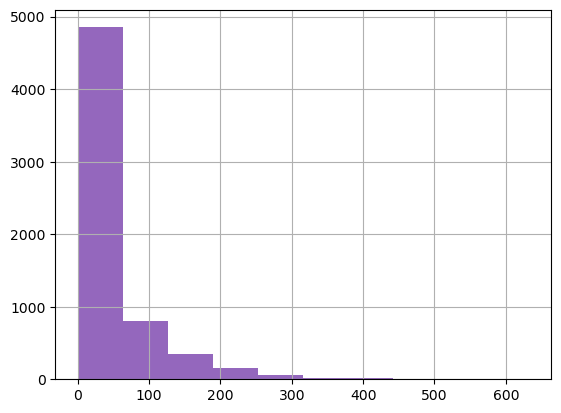

In [93]:
df.number_of_reviews.hist()
plt.show()

/tmp/ipykernel_71884/2002717571.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['log_number_of_reviews'] = np.log(df.number_of_reviews+0.01)


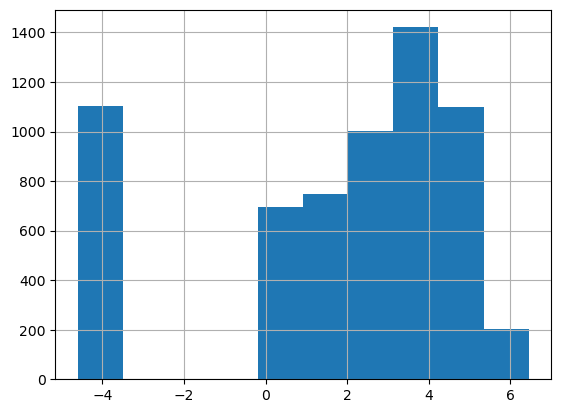

In [103]:
df['log_number_of_reviews'] = np.log(df.number_of_reviews+0.01)
df.log_number_of_reviews.hist()
plt.show()

I think that looks better and I think there is a benefit to having the samples with no reviews a little further from the distribution of the samples with reviews. I'll do the same for 'reviews_per_month'.

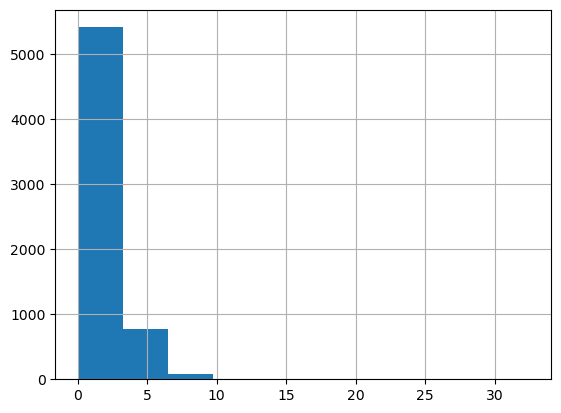

In [104]:
df.reviews_per_month.hist()
plt.show()

/tmp/ipykernel_71884/4162080560.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['log_reviews_per_month'] = np.log(df.reviews_per_month+0.01)


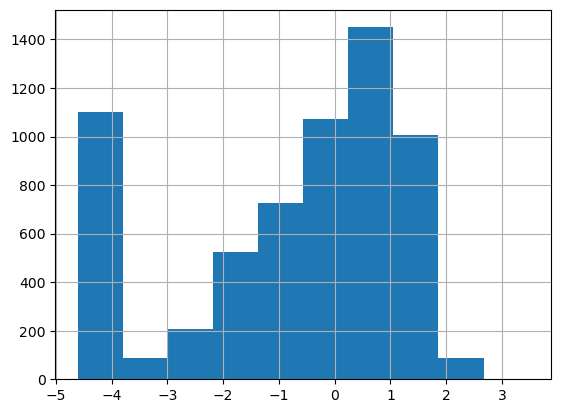

In [105]:
df['log_reviews_per_month'] = np.log(df.reviews_per_month+0.01)
df.log_reviews_per_month.hist()
plt.show()

In [106]:
transformations.loc['log_number_of_reviews'] = ['log transform', 'log transform of number_of_reviews']
transformations.loc['log_reviews_per_month'] = ['log transform', 'log transform of reviews_per_month']
transformations.loc['number_of_reviews'] = ['drop', '']
transformations.loc['reviews_per_month'] = ['drop', '']
transformations

,action,info
id,NaN,NaN
name,NaN,NaN
host_id,NaN,NaN
host_name,NaN,NaN
neighbourhood_group,drop,
neighbourhood,reduced categories,"kept top 10 and set the rest to missing, then ..."
latitude,NaN,NaN
longitude,NaN,NaN
room_type,convert to categorical,
price,remove outliers,removed values above 99.9th percentile and a c...


In [107]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6271 entries, 230 to 860
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   id                              6271 non-null   int64   
 1   name                            6271 non-null   object  
 2   host_id                         6271 non-null   int64   
 3   host_name                       6271 non-null   object  
 4   neighbourhood                   6271 non-null   category
 5   latitude                        6271 non-null   float64 
 6   longitude                       6271 non-null   float64 
 7   room_type                       6271 non-null   category
 8   price                           6271 non-null   int64   
 9   minimum_nights                  6271 non-null   int64   
 10  number_of_reviews               6271 non-null   int64   
 11  reviews_per_month               6271 non-null   float64 
 12  calculated_host_listings

In [80]:
# df.drop(columns=['id', 'name', 'host_id', 'host_name'], inplace=True)
# transformations.loc[['id', 'name', 'host_id', 'host_name']] = ['drop', '']
# transformations